# WELCOME!

# #Determines
In this project you have HR data of a company. A study is requested from you to predict which employee will churn by using this data.

The HR dataset has 14,999 samples. In the given dataset, you have two types of employee one who stayed and another who left the company.

You can describe 10 attributes in detail as:
- ***satisfaction_level:*** It is employee satisfaction point, which ranges from 0-1.
- ***last_evaluation:*** It is evaluated performance by the employer, which also ranges from 0-1.
- ***number_projects:*** How many of projects assigned to an employee?
- ***average_monthly_hours:*** How many hours in averega an employee worked in a month?
- **time_spent_company:** time_spent_company means employee experience. The number of years spent by an employee in the company.
- ***work_accident:*** Whether an employee has had a work accident or not.
- ***promotion_last_5years:*** Whether an employee has had a promotion in the last 5 years or not.
- ***Departments:*** Employee's working department/division.
- ***Salary:*** Salary level of the employee such as low, medium and high.
- ***left:*** Whether the employee has left the company or not.

First of all, to observe the structure of the data, outliers, missing values and features that affect the target variable, you must use exploratory data analysis and data visualization techniques. 

Then, you must perform data pre-processing operations such as ***Scaling*** and ***Label Encoding*** to increase the accuracy score of Gradient Descent Based or Distance-Based algorithms. you are asked to perform ***Cluster Analysis*** based on the information you obtain during exploratory data analysis and data visualization processes. 

The purpose of clustering analysis is to cluster data with similar characteristics. You are asked to use the ***K-means*** algorithm to make cluster analysis. However, you must provide the K-means algorithm with information about the number of clusters it will make predictions. Also, the data you apply to the K-means algorithm must be scaled. In order to find the optimal number of clusters, you are asked to use the ***Elbow method***. Briefly, try to predict the set to which individuals are related by using K-means and evaluate the estimation results.

Once the data is ready to be applied to the model, you must ***split the data into train and test***. Then build a model to predict whether employees will churn or not. Train your models with your train set, test the success of your model with your test set. 

Try to make your predictions by using the algorithms ***Gradient Boosting Classifier***, ***K Neighbors Classifier***, ***Random Forest Classifier***. You can use the related modules of the ***scikit-learn*** library. You can use scikit-learn ***Confusion Metrics*** module for accuracy calculation. You can use the ***Yellowbrick*** module for model selection and visualization.

In the final step, you will deploy your model using Streamlit tool.



# #Tasks

#### 1. Exploratory Data Analysis
- Importing Modules
- Loading Dataset
- Data Insigts

#### 2. Data Visualization
- Employees Left
- Determine Number of Projects
- Determine Time Spent in Company
- Subplots of Features

#### 3. Data Pre-Processing
- Scaling
- Label Encoding

#### 4. Cluster Analysis
- Find the optimal number of clusters (k) using the elbow method for for K-means.
- Determine the clusters by using K-Means then Evaluate predicted results.

#### 5. Model Building
- Split Data as Train and Test set
- Built Gradient Boosting Classifier, Evaluate Model Performance and Predict Test Data
- Built K Neighbors Classifier and Evaluate Model Performance and Predict Test Data
- Built Random Forest Classifier and Evaluate Model Performance and Predict Test Data

#### 6. Model Deployement

- Save and Export the Model as .pkl
- Save and Export Variables as .pkl 

## 1. Exploratory Data Analysis

Exploratory Data Analysis is an initial process of analysis, in which you can summarize characteristics of data such as pattern, trends, outliers, and hypothesis testing using descriptive statistics and visualization.

In [2]:
pip install lightgbm


Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install catboost

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install matplotlib.colorbar

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install termcolor

Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install -U scikit-learn

Note: you may need to restart the kernel to use updated packages.


### Importing Modules

In [7]:
import colorama
from colorama import Fore, Style  # makes strings colored
from termcolor import colored
from termcolor import cprint
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import math
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
import plotly.figure_factory as ff

c:\Users\Necip\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [8]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import cross_validate
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import ConfusionMatrixDisplay, classification_report
from sklearn.metrics import RocCurveDisplay, precision_recall_curve, roc_auc_score, auc
from sklearn.metrics import roc_curve, average_precision_score, precision_recall_curve
from sklearn.preprocessing import OrdinalEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier , GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
import lightgbm as lgb
from xgboost import plot_importance
from sklearn.feature_extraction.text import TfidfVectorizer
from catboost import CatBoostClassifier

### Loading Dataset

Let's first load the required HR dataset using pandas's "read_csv" function.

In [9]:
df_org = pd.read_csv("HR_Dataset.csv")
df = df_org.copy()
df.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,Departments,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.11,0.88,7,272,4,0,1,0,sales,medium
3,0.72,0.87,5,223,5,0,1,0,sales,low
4,0.37,0.52,2,159,3,0,1,0,sales,low


### Data Insights

In the given dataset, you have two types of employee one who stayed and another who left the company. So, you can divide data into two groups and compare their characteristics. Here, you can find the average of both the groups using groupby() and mean() function.

In [10]:
## Some Useful User-Defined-Functions

###############################################################################

def missing_values(df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values[missing_values['Missing_Number']>0]

###############################################################################

def first_looking(df):
    print(colored("Shape:", 'yellow', attrs=['bold']), df.shape,'\n', 
          colored('*'*100, 'red', attrs=['bold']),
          colored("\nInfo:\n",'yellow', attrs=['bold']), sep='')
    print(df.info(), '\n', 
          colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Number of Uniques:\n", 'yellow', attrs=['bold']), df.nunique(),'\n',
          colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Missing Values:\n", 'yellow', attrs=['bold']), missing_values(df),'\n', 
          colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("All Columns:", 'yellow', attrs=['bold']), *list(df.columns), sep='\n- ') 
    print(colored('*'*100, 'red', attrs=['bold']), sep='')

################################################################################

def summary(column):
    print(colored("Column: ",'yellow', attrs=['bold']), column)
    print(colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Missing values: ", 'yellow', attrs=['bold']), df[column].isnull().sum())
    print(colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Missing values(%): ", 'yellow', attrs=['bold']), round(df[column].isnull().sum()/df.shape[0]*100, 2))
    print(colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Unique values: ", 'yellow', attrs=['bold']), df[column].nunique())
    print(colored('*'*100, 'red', attrs=['bold']), sep='')
    print(colored("Value counts: \n", 'yellow', attrs=['bold']), df[column].value_counts(dropna = False), sep='')
    print(colored('*'*100, 'red', attrs=['bold']), sep='')

In [11]:
df.columns = df.columns.str.lower().str.replace(" ","_")

In [12]:
first_looking(df)

Shape:(14999, 10)
****************************************************************************************************
Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     14999 non-null  float64
 1   last_evaluation        14999 non-null  float64
 2   number_project         14999 non-null  int64  
 3   average_montly_hours   14999 non-null  int64  
 4   time_spend_company     14999 non-null  int64  
 5   work_accident          14999 non-null  int64  
 6   left                   14999 non-null  int64  
 7   promotion_last_5years  14999 non-null  int64  
 8   departments_           14999 non-null  object 
 9   salary                 14999 non-null  object 
dtypes: float64(2), int64(6), object(2)
memory usage: 1.1+ MB
None
**************************************************************************

In [13]:
summary("satisfaction_level")

Column:  satisfaction_level
****************************************************************************************************
Missing values:  0
****************************************************************************************************
Missing values(%):  0.0
****************************************************************************************************
Unique values:  92
****************************************************************************************************
Value counts: 
satisfaction_level
0.10    358
0.11    335
0.74    257
0.77    252
0.84    247
       ... 
0.25     34
0.28     31
0.27     30
0.26     30
0.12     30
Name: count, Length: 92, dtype: int64
****************************************************************************************************


In [14]:
fig = px.histogram(df, x="satisfaction_level",
                   marginal="box", # or violin, rug
                   hover_data=df.columns,
                   width=800, height=400,
                   title="Age",
                   color_discrete_sequence = ['#2BCDC1'],
                  nbins=100)
fig.show()

In [15]:
summary("last_evaluation")

Column:  last_evaluation
****************************************************************************************************
Missing values:  0
****************************************************************************************************
Missing values(%):  0.0
****************************************************************************************************
Unique values:  65
****************************************************************************************************
Value counts: 
last_evaluation
0.55    358
0.50    353
0.54    350
0.51    345
0.57    333
       ... 
0.39     52
0.43     50
0.38     50
0.44     44
0.36     22
Name: count, Length: 65, dtype: int64
****************************************************************************************************


In [16]:
fig = px.histogram(df, x="last_evaluation",
                   marginal="box", # or violin, rug
                   hover_data=df.columns,
                   width=800, height=400,
                   title="Age",
                  nbins=100)
fig.show()

In [17]:
summary("number_project")

Column:  number_project
****************************************************************************************************
Missing values:  0
****************************************************************************************************
Missing values(%):  0.0
****************************************************************************************************
Unique values:  6
****************************************************************************************************
Value counts: 
number_project
4    4365
3    4055
5    2761
2    2388
6    1174
7     256
Name: count, dtype: int64
****************************************************************************************************


In [18]:
fig = px.histogram(df, x="number_project",
                   #marginal="box", # or violin, rug
                   hover_data=df.columns,
                   width=800, height=400,
                   title="Age",
                   color_discrete_sequence = ['coral'],
                  nbins=20)
fig.show()

In [19]:
summary("average_montly_hours")

Column:  average_montly_hours
****************************************************************************************************
Missing values:  0
****************************************************************************************************
Missing values(%):  0.0
****************************************************************************************************
Unique values:  215
****************************************************************************************************
Value counts: 
average_montly_hours
135    153
156    153
149    148
151    147
160    136
      ... 
297      7
288      6
299      6
96       6
303      6
Name: count, Length: 215, dtype: int64
****************************************************************************************************


In [20]:
fig = px.histogram(df, x="average_montly_hours",
                   marginal="box", # or violin, rug
                   hover_data=df.columns,
                   width=800, height=400,
                   title="Age",
                   color_discrete_sequence = ['mediumseagreen'],
                  nbins=200)
fig.show()

In [21]:
summary("time_spend_company")

Column:  time_spend_company
****************************************************************************************************
Missing values:  0
****************************************************************************************************
Missing values(%):  0.0
****************************************************************************************************
Unique values:  8
****************************************************************************************************
Value counts: 
time_spend_company
3     6443
2     3244
4     2557
5     1473
6      718
10     214
7      188
8      162
Name: count, dtype: int64
****************************************************************************************************


In [22]:
fig = px.histogram(df, x="time_spend_company",
                   #marginal="box", # or violin, rug
                   hover_data=df.columns,
                   width=800, height=400,
                   title="Age",
                   color_discrete_sequence = ['lightsalmon'],
                  nbins=20)
fig.show()

In [23]:
summary("work_accident")

Column:  work_accident
****************************************************************************************************
Missing values:  0
****************************************************************************************************
Missing values(%):  0.0
****************************************************************************************************
Unique values:  2
****************************************************************************************************
Value counts: 
work_accident
0    12830
1     2169
Name: count, dtype: int64
****************************************************************************************************


In [24]:
px.pie(df.work_accident.value_counts(),
       names=df.work_accident.value_counts().index,
       values=df.work_accident.value_counts().values, 
       title='work_accident',
      width=400, height=400,
      color_discrete_sequence= px.colors.qualitative.Dark24)

In [25]:
summary("promotion_last_5years")

Column:  promotion_last_5years
****************************************************************************************************
Missing values:  0
****************************************************************************************************
Missing values(%):  0.0
****************************************************************************************************
Unique values:  2
****************************************************************************************************
Value counts: 
promotion_last_5years
0    14680
1      319
Name: count, dtype: int64
****************************************************************************************************


In [26]:
px.pie(df.promotion_last_5years.value_counts(),
       names=df.promotion_last_5years.value_counts().index,
       values=df.promotion_last_5years.value_counts().values, 
       title='promotion_last_5years',
      width=400, height=400,
      color_discrete_sequence= px.colors.qualitative.Plotly)

In [27]:
summary("departments_")

Column:  departments_
****************************************************************************************************
Missing values:  0
****************************************************************************************************
Missing values(%):  0.0
****************************************************************************************************
Unique values:  10
****************************************************************************************************
Value counts: 
departments_
sales          4140
technical      2720
support        2229
IT             1227
product_mng     902
marketing       858
RandD           787
accounting      767
hr              739
management      630
Name: count, dtype: int64
****************************************************************************************************


In [28]:
fig = px.histogram(df, x="time_spend_company",
                   #marginal="box", # or violin, rug
                   hover_data=df.columns,
                   width=800, height=400,
                   title="Age",
                   color_discrete_sequence = ['lightskyblue'],
                  nbins=20)
fig.show()

In [29]:
summary("salary")

Column:  salary
****************************************************************************************************
Missing values:  0
****************************************************************************************************
Missing values(%):  0.0
****************************************************************************************************
Unique values:  3
****************************************************************************************************
Value counts: 
salary
low       7316
medium    6446
high      1237
Name: count, dtype: int64
****************************************************************************************************


In [30]:
fig = px.histogram(df, x="salary",
                   #marginal="box", # or violin, rug
                   hover_data=df.columns,
                   width=400, height=400,
                   title="Salary",
                   color_discrete_sequence = ['mediumspringgreen'],
                  nbins=30)
fig.show()

In [31]:
cat_columns = ['number_project', 'time_spend_company', 'work_accident',
       'promotion_last_5years', 'departments_', 'salary']

In [32]:
num_columns = ['satisfaction_level', 'last_evaluation','average_montly_hours']

## 2. Data Visualization

You can search for answers to the following questions using data visualization methods. Based on these responses, you can develop comments about the factors that cause churn.
- How does the promotion status affect employee churn?
- How does years of experience affect employee churn?
- How does workload affect employee churn?
- How does the salary level affect employee churn?

### Employees Left

Let's check how many employees were left?
Here, you can plot a bar graph using Matplotlib. The bar graph is suitable for showing discrete variable counts.

In [33]:
summary("left")

Column:  left
****************************************************************************************************
Missing values:  0
****************************************************************************************************
Missing values(%):  0.0
****************************************************************************************************
Unique values:  2
****************************************************************************************************
Value counts: 
left
0    11428
1     3571
Name: count, dtype: int64
****************************************************************************************************


In [34]:
px.pie(df.left.value_counts(),
       names=df.left.value_counts().index,
       values=df.left.value_counts().values, 
       title='left',
      width=400, height=400,
      color_discrete_sequence= px.colors.qualitative.Pastel1)

### Number of Projects

Similarly, you can also plot a bar graph to count the number of employees deployed on how many projects?

In [35]:
fig = px.histogram(df, x="number_project",
                   #marginal="box", # or violin, rug
                   hover_data=df.columns,
                   width=800, height=400,
                   title="Salary",
                   color="left",
                   barmode="group",
                   color_discrete_sequence=px.colors.qualitative.Bold,
                   text_auto=True,
                  nbins=10)
fig.show()

### Time Spent in Company

Similarly, you can also plot a bar graph to count the number of employees have based on how much experience?


In [36]:
fig = px.histogram(df, x="time_spend_company",
                   #marginal="box", # or violin, rug
                   hover_data=df.columns,
                   width=1000, height=400,
                   title="Salary",
                   color="left",
                   barmode="group",
                   color_discrete_sequence=px.colors.qualitative.Bold,
                   text_auto=True,
                  nbins=10)
fig.show()

### Subplots of Features

You can use the methods of the matplotlib.

ValueError: Cannot use `hue` without `x` and `y`

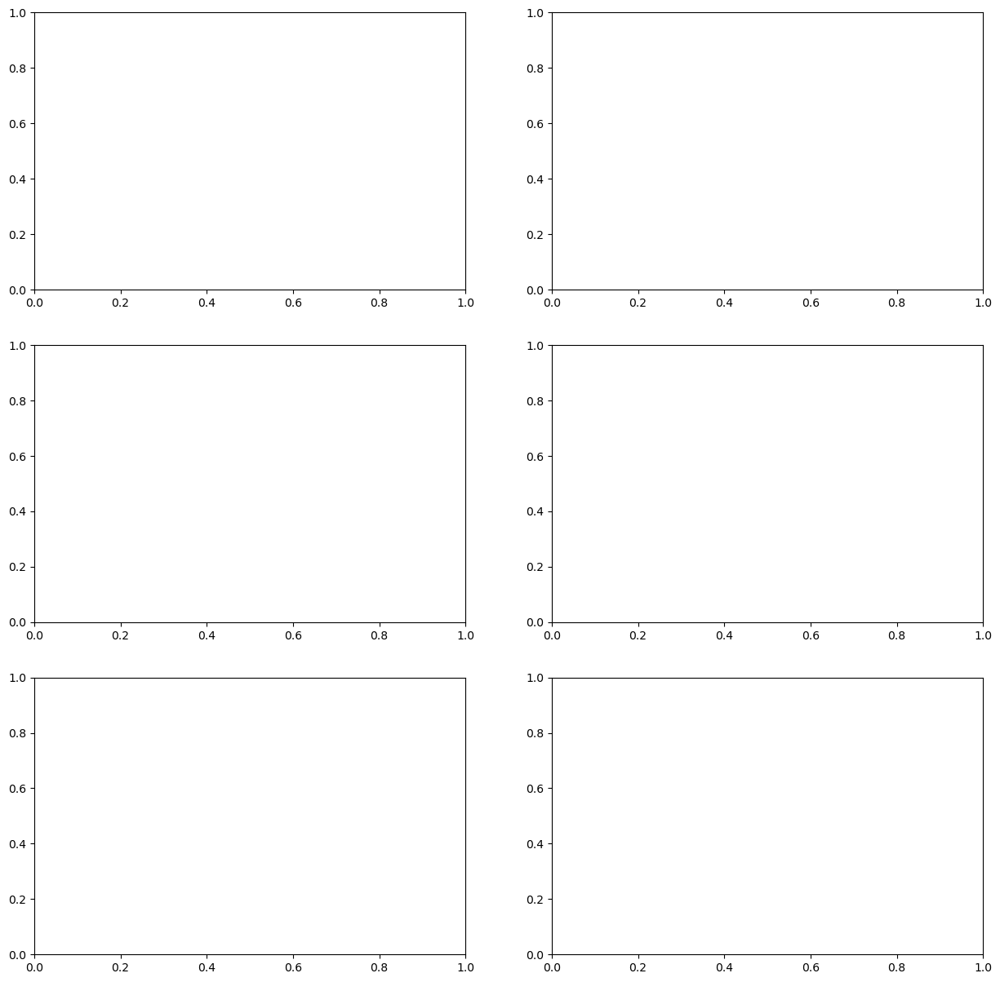

In [37]:
fig, axs = plt.subplots(3, 2, figsize=(15,15))
ax = axs.flatten()
for i in range(0,6):
    sns.countplot(df[cat_columns[i]], ax=ax[i], hue=df['left'],palette=["#9b59b6", "#3498db"])
    ax[i].set_xticklabels(ax[i].get_xticklabels(), fontsize=8)
    bars = ax[i].patches
    half = int(len(bars)/2)
    left_bars = bars[:half]
    right_bars = bars[half:]
    for left, right in zip(left_bars, right_bars):
        height_l = left.get_height()
        height_r = right.get_height()
        total = height_l + height_r
        if total>0:
            ax[i].text(left.get_x() + left.get_width()/2., height_l + 40, '{0:.0%}'.format(height_l/total), ha="center")
            ax[i].text(right.get_x() + right.get_width()/2., height_r + 40, '{0:.0%}'.format(height_r/total), ha="center")
    
#ax[-1].set_visible(False)

* The rate of workers leaving their jobs is 24%. 
* Employees who did 3, 4 and 5 projects have a lower left rate.
* Employees who have been working for 4.5,6 years have a higher left rate.
* Employees who have had a work accident have a lower left rate.
* Employees who have had promotion in last 5 years have a lower left rate.
* According to the departments, the left rates are close to each other.
* Employees with low salary have higher left rates.

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(12,5)) 
ax=axs.flatten()
for i in range(3):
    sns.barplot(y=num_columns[i], x="left", data=df, ax=ax[i],palette=["#9b59b6", "#3498db"])
    ax[i].bar_label(ax[i].containers[-1], fmt='Mean:\n%.2f', label_type='center')
plt.tight_layout();

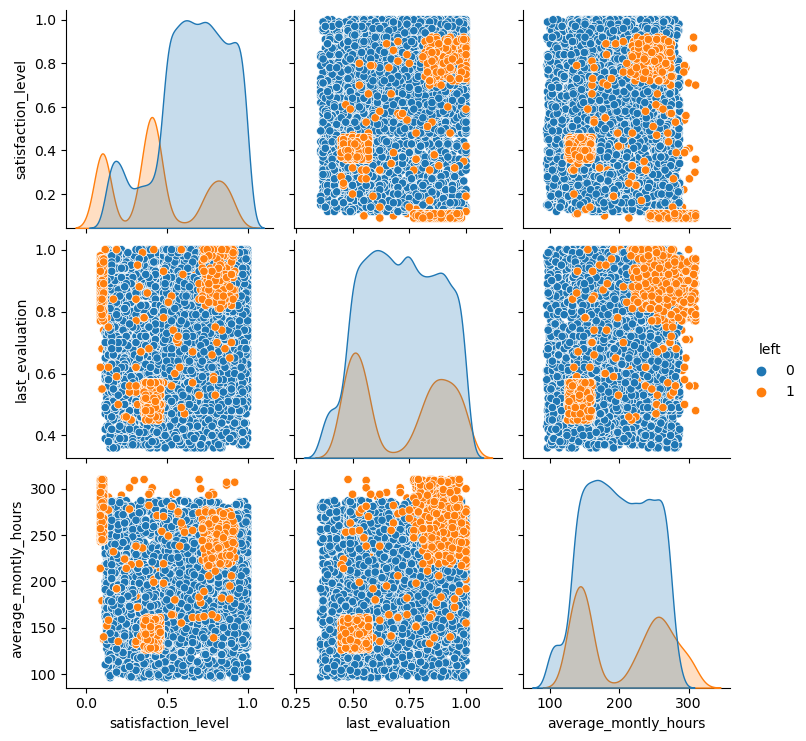

In [ ]:
data = df[num_columns].join(df['left'])
sns.pairplot(data=data, hue='left');

<Axes: >

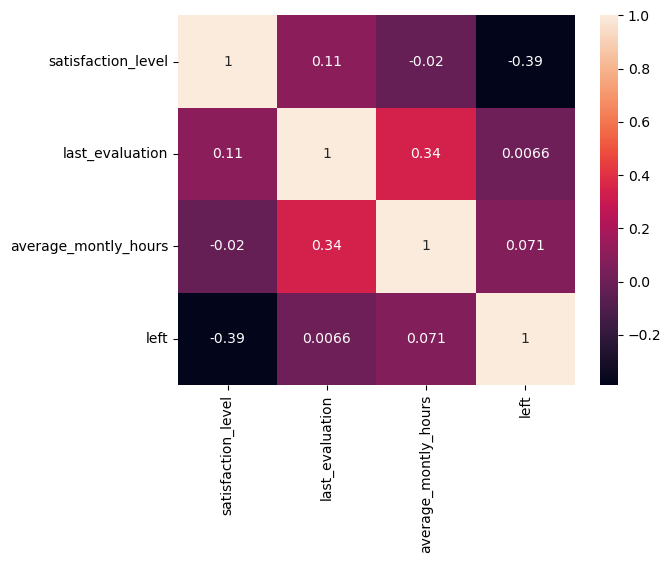

In [ ]:
sns.heatmap(data.corr(), annot=True)

* It is seemed that last_evaluation and average_monthly_hours has almost no effect on target.
* However satisfaction score has an effect on target. Employees who left their job have lower satisfaction scores. There is a negative correlation between left and satisfaction_score column.

## 3. Data Pre-Processing

#### Ordinal Encoding

Lots of machine learning algorithms require numerical input data, so you need to represent categorical columns in a numerical column. In order to encode this data, you could map each value to a number. e.g. Salary column's value can be represented as low:0, medium:1, and high:2. This process is known as ordinal encoding, and sklearn conveniently will do this for you using [OrdinalEncoder](https://datascience.stackexchange.com/questions/39317/difference-between-ordinalencoder-and-labelencoder).



In [ ]:
df_ord = df.copy()

In [ ]:
cat_columns[-2:]

['departments_', 'salary']

In [ ]:
enc = OrdinalEncoder()
df_ord[cat_columns[-2:]] = enc.fit_transform(df_ord[cat_columns[-2:]])
df_ord.head(2).T

,0,1
satisfaction_level,0.38,0.80
last_evaluation,0.53,0.86
number_project,2.00,5.00
average_montly_hours,157.00,262.00
time_spend_company,3.00,6.00
work_accident,0.00,0.00
left,1.00,1.00
promotion_last_5years,0.00,0.00
departments_,7.00,7.00
salary,1.00,2.00


#### Scaling

Some machine learning algorithms are sensitive to feature scaling while others are virtually invariant to it. Machine learning algorithms like linear regression, logistic regression, neural network, etc. that use gradient descent as an optimization technique require data to be scaled. Also distance algorithms like KNN, K-means, and SVM are most affected by the range of features. This is because behind the scenes they are using distances between data points to determine their similarity.

Scaling Types:
- Normalization: Normalization is a scaling technique in which values are shifted and rescaled so that they end up ranging between 0 and 1. It is also known as Min-Max scaling.

- Standardization: Standardization is another scaling technique where the values are centered around the mean with a unit standard deviation. This means that the mean of the attribute becomes zero and the resultant distribution has a unit standard deviation.

    

In [ ]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_ord.drop("left", axis=1))

## 5. Model Building

### Split Data as Train and Test Set

Here, Dataset is broken into two parts, for example, in ratio of 70:30. It means 70% data will used for model training and 30% for model testing.

In [ ]:
X=df_ord.drop(["left"], axis=1)
y=df_ord["left"]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, stratify=y, random_state=5)

In [ ]:
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### Measure Functions

In [ ]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print("--------------------------------------")
    print("Confusion_matrix: ")
    print(confusion_matrix(y_test, y_pred))
    print("classification_report")
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print("--------------------------------------")
    print("Confusion_matrix:")
    print(confusion_matrix(y_train, y_train_pred))
    print("classification_report")
    print(classification_report(y_train, y_train_pred))
    fig, axes = plt.subplots(nrows=1, ncols=2)
    ax = axes.flatten()
    plot_confusion_matrix(model, X_test, y_test, ax=ax[0])
    ax[0].title.set_text("Test Confusion Matrix")
    plot_confusion_matrix(model, X_train, y_train, ax=ax[1])
    ax[1].title.set_text("Train Confusion Matrix");

In [ ]:
def metric_df(model, X_train, y_train, X_test, y_test,name):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    scores = {name: {"accuracy" : accuracy_score(y_test,y_pred),
    "precision" : precision_score(y_test, y_pred),
    "recall" : recall_score(y_test, y_pred),                          
    "f1" : f1_score(y_test,y_pred),
     "True Negative Rate": confusion_matrix(y_test,y_pred)[0][0]/confusion_matrix(y_test,y_pred).sum(),
     "False Positive Rate": confusion_matrix(y_test,y_pred)[0][1]/confusion_matrix(y_test,y_pred).sum(),
    "False Negative Rate": confusion_matrix(y_test,y_pred)[1][0]/confusion_matrix(y_test,y_pred).sum(),
    "True Positive Rate": confusion_matrix(y_test,y_pred)[1][1]/confusion_matrix(y_test,y_pred).sum()}}
    return pd.DataFrame(scores)

### 5.1.Logistic Regression

In [ ]:
log_model=LogisticRegression(class_weight= ["balanced"] )

In [ ]:
log_model.fit(X_train_scaled, y_train)

In [ ]:
eval_metric(log_model, X_train_scaled, y_train, X_test_scaled, y_test)

#### GridSearchCV Log

In [ ]:
model_lg = LogisticRegression()
penalty = ["l1", "l2"]
C = np.logspace(-1, 5, 5)
class_weight= ["balanced", None] 
solver = ["lbfgs", "liblinear", "sag", "saga"]

param_grid = {"penalty" : penalty,
              "C" : C,
              "class_weight":class_weight,
              "solver":solver}

log_grid_model = GridSearchCV(estimator=model_lg,
                          param_grid=param_grid,
                          cv=10,
                          scoring = "recall",  
                          n_jobs = -1)

In [ ]:
log_grid_model.fit(X_train_scaled,y_train)

In [ ]:
log_grid_model.best_params_

In [ ]:
eval_metric(log_grid_model, X_train_scaled, y_train, X_test_scaled, y_test)

In [ ]:
log = metric_df(log_grid_model, X_train_scaled, y_train, X_test_scaled, y_test, 'LOG')
log

### 5.2. KNN

In [ ]:
test_error_rates = []

for k in range(1,15,2):
    knn_model = KNeighborsClassifier(n_neighbors=k)
    knn_model.fit(X_train_scaled,y_train) 
   
    y_pred_test = knn_model.predict(X_test_scaled)
    
    
    test_error = 1 - accuracy_score(y_test,y_pred_test)
    
    test_error_rates.append(test_error)

In [ ]:
plt.figure(figsize=(15,8))
plt.plot(range(1,15,2), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)

plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')
plt.show()

**It is seen that best K value is 1.**

In [ ]:
knn = KNeighborsClassifier(n_neighbors=1)

knn.fit(X_train_scaled,y_train)
print('WITH K=1\n')
eval_metric(knn, X_train_scaled, y_train, X_test_scaled, y_test)

In [ ]:
knn1 = KNeighborsClassifier(n_neighbors=1)

scores = cross_validate(knn1, X_train_scaled, y_train, scoring = ['accuracy', 'precision','recall',
                                                                   'f1'], cv = 10)
df_knn_scores = pd.DataFrame(scores, index = range(1, 11))
df_knn_scores

In [ ]:
df_knn_scores.mean()[2:]

#### GridSearchCV KNN

In [ ]:
knn_grid = KNeighborsClassifier()

k_values= range(1,15,2)

param_grid = {"n_neighbors":k_values, "p": [1,2], "weights": ['uniform', "distance"]}

knn_grid_model = GridSearchCV(knn_grid, param_grid, cv=10, scoring= 'accuracy')

knn_grid_model.fit(X_train_scaled, y_train)

In [ ]:
knn_grid_model.best_params_

In [ ]:
print('WITH K=1\n')
eval_metric(knn_grid_model, X_train_scaled, y_train, X_test_scaled, y_test)

**KNN GridSeachCV: Best k parameter was found as k=1. With this parameter model overfitted but since test scores also high it can be admitted. **

In [ ]:
knn_df = metric_df(knn, X_train_scaled, y_train, X_test_scaled, y_test, 'KNN')
knn_df

### 5.3. SVM

In [ ]:
svm_model = SVC(random_state=5)
svm_model.fit(X_train_scaled, y_train)

In [ ]:
eval_metric(svm_model, X_train_scaled, y_train, X_test_scaled, y_test)

In [ ]:
svm_model2 = SVC(random_state=5)
scores = cross_validate(svm_model2, X_train_scaled, y_train, scoring = ['accuracy', 'precision','recall','f1'], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

#### GridSearchCV SVM

In [ ]:
param_grid = {'C': [0.02, 0.04, 0.06],
              'gamma': [0.02, 0.04],
              'kernel': ['rbf','linear']}

svm_model = SVC(random_state=5)

svm_model_grid = GridSearchCV(svm_model, param_grid, cv=5, n_jobs=-1)

svm_model_grid.fit(X_train_scaled, y_train)

In [ ]:
svm_model_grid.best_params_

In [ ]:
eval_metric(svm_model_grid, X_train_scaled, y_train, X_test_scaled, y_test)

In [ ]:
svm_model_last = SVC(random_state=5, class_weight= "balanced", C=0.06, gamma=0.04, kernel='rbf')
svm_model_last.fit(X_train_scaled, y_train)

In [ ]:
eval_metric(svm_model_last, X_train_scaled, y_train, X_test_scaled, y_test)

In [ ]:
svm_df = metric_df(svm_model_last, X_train_scaled, y_train, X_test_scaled, y_test, 'SVM')
svm_df

### 5.4. Random Forest

In [ ]:
rfc = RandomForestClassifier(n_estimators=100, class_weight="balanced")

rfc.fit(X_train, y_train)

In [ ]:
eval_metric(rfc, X_train, y_train, X_test, y_test)

#### GridSearchCV RF

In [ ]:
param_grid = {'n_estimators':[100,200],
             'criterion': ["gini","entropy"],
             'max_depth':[10,11,13],
             'min_samples_split':[2,3],
              "class_weight":["balanced"]
             }

rfc_model = RandomForestClassifier()
rfc_grid = GridSearchCV(rfc_model,
                             param_grid,
                             verbose=2,
                             scoring="recall",
                             n_jobs=-1)

rfc_grid.fit(X_train,y_train)

In [ ]:
rfc_grid.best_params_

In [ ]:
eval_metric(rfc_grid, X_train, y_train, X_test, y_test)

In [ ]:
rfc_df = metric_df(rfc_grid, X_train, y_train, X_test, y_test, 'RF')
rfc_df

### 5.5. XGBoost

In [ ]:
xgb_classifier = XGBClassifier()
xgb_classifier.fit(X_train, y_train)

In [ ]:
eval_metric(xgb_classifier, X_train, y_train, X_test, y_test)

#### GridSearchCV XG

In [ ]:
param_grid = {"n_estimators":[200,400],
              'max_depth':[4,6,8], 
              "learning_rate": [0.1,0.2,0.3]
             }
xgb_model = XGBClassifier(random_state=5)
xgb_grid = GridSearchCV(xgb_model, param_grid, scoring = "recall", verbose=2, n_jobs = -1).fit(X_train, y_train)

In [ ]:
xgb_grid.best_params_

In [ ]:
eval_metric(xgb_grid, X_train, y_train, X_test, y_test)

In [ ]:
xgb_model_last = XGBClassifier(random_state=5, n_estimators=200, max_depth=4,learning_rate=0.5)
xgb_model_last.fit(X_train, y_train)

In [ ]:
eval_metric(xgb_model_last, X_train, y_train, X_test, y_test)

In [ ]:
xg_df = metric_df(xgb_model_last, X_train, y_train, X_test, y_test, 'XGB')
xg_df

There is a overfitting in the model. Some hyperparameters were tuned in order to handle overfitting. Model is also close to overfitting but there are some false predictions in the train data set. 

### 5.6. AdaBoost

In [ ]:
ada_model = AdaBoostClassifier(random_state=5)
ada_model.fit(X_train, y_train)

In [ ]:
eval_metric(ada_model, X_train, y_train, X_test, y_test)

#### GridSearchCV AB

In [ ]:
model_a = AdaBoostClassifier(random_state=5)

param_grid = {"n_estimators": [100,150], "learning_rate": [0.5,0.7, 0.8]}

ada_grid_model = GridSearchCV(model_a, param_grid, cv=5, scoring= 'recall',n_jobs = -1)

ada_grid_model.fit(X_train, y_train)

In [ ]:
ada_grid_model.best_params_

In [ ]:
eval_metric(ada_grid_model, X_train, y_train, X_test, y_test)

In [ ]:
ada_df = metric_df(ada_grid_model, X_train, y_train, X_test, y_test, 'Ada')
ada_df

### 5.7. GradientBoost

In [ ]:
grad_model = GradientBoostingClassifier(random_state=5)
grad_model.fit(X_train, y_train)

In [ ]:
eval_metric(grad_model, X_train, y_train, X_test, y_test)

#### GridSearchCV GB

In [ ]:
model_g = GradientBoostingClassifier(random_state=5)

param_grid = {"n_estimators":[200, 300],
             "subsample":[1], 
              "learning_rate": [0.3,0.4], 
              'max_depth':[3,4]}

grad_grid_model = GridSearchCV(model_g, param_grid, cv=5, scoring= 'recall',n_jobs = -1)

grad_grid_model.fit(X_train, y_train)

In [ ]:
grad_grid_model.best_params_

In [ ]:
eval_metric(grad_grid_model, X_train, y_train, X_test, y_test)

In [ ]:
grad_model_last = GradientBoostingClassifier(random_state=5, 
                                             learning_rate=0.4,
                                             max_depth=4, 
                                             n_estimators=120, 
                                             subsample=1)
grad_model_last.fit(X_train, y_train)

In [ ]:
eval_metric(grad_model_last, X_train, y_train, X_test, y_test)

In [ ]:
grad_df = metric_df(grad_model_last, X_train, y_train, X_test, y_test, 'Grad')
grad_df

There is a overfitting in the model. Some hyperparameters were tuned in order to handle overfitting. Model is also close to overfitting but there are some false predictions in the train data set. 

### 5.8. LightGBM

In [ ]:
lg_model = lgb.LGBMClassifier(random_state=5)
lg_model.fit(X_train,y_train)

In [ ]:
eval_metric(lg_model, X_train, y_train, X_test, y_test)

#### GridSearchCV LG

In [ ]:
model_lg = lgb.LGBMClassifier(boosting_type='gbdt',  
                                              objective='binary',  
                                              metric='recall'
                                              )

param_grid = {
     'learning_rate': [0.2,0.3],
    'num_leaves': [10,15],
    'lambda_l1': [0, 1],
    'lambda_l2': [0, 1]
    }

lgb_grid_model = GridSearchCV(model_lg, param_grid, n_jobs = -1)


lgb_grid_model.fit(X_train, y_train)

In [ ]:
lgb_grid_model.best_params_

In [ ]:
eval_metric(lgb_grid_model, X_train, y_train, X_test, y_test)

In [ ]:
lg_df = metric_df(lgb_grid_model, X_train, y_train, X_test, y_test, 'LG')
lg_df

There is a overfitting in the model. Some hyperparameters were tuned in order to handle overfitting. Model is also close to overfitting but there are some false predictions in the train data set. 

## 6. Recall, F1 Comparison

In [ ]:
df_result = pd.concat([log,knn_df,svm_df,rfc_df,xg_df,ada_df,grad_df,lg_df], axis=1)
df_result.sort_values(by="recall", axis=1, ascending=False).T

In [ ]:
df_result[4:].sort_values(by="recall", axis=1, ascending=False).plot.bar(figsize = (15,6), cmap="viridis")
plt.legend(loc="upper right")
plt.show()

In [ ]:
ax = df_result[-1:].T.sort_values(by="recall").plot.barh(figsize=(12,10), legend=None)
plt.title("Test Recall Score of Different Models", size=14)
for patch in ax.patches:
    ax.text(
        patch.get_width(), 
        patch.get_y()+0.15,
        " {:.2f}".format(patch.get_width()), 
        fontsize=12
    )

In [ ]:
ax = df_result[5:6].T.sort_values(by="f1").plot.barh(figsize=(12,10), legend=None)
plt.title("Test F1 Score of Different Models", size=14)
for patch in ax.patches:
    ax.text(
        patch.get_width(), 
        patch.get_y()+0.15,
        " {:.2f}".format(patch.get_width()), 
        fontsize=12
    )

In [ ]:
models = [grad_model_last,xgb_model_last,lgb_grid_model,ada_grid_model, 
          rfc_grid]
models2 = ["grad_grid_model","xgb_grid","lgb_grid_model","ada_grid_model",
           "rfc_grid"]
fig, axes = plt.subplots(2,3, figsize=(18,12))
ax = axes.flatten()
i = 0
for model in models:
    proba= model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test,  proba)
    auc = roc_auc_score(y_test, proba)
    ax[i].plot(fpr,tpr,label="auc="+str(auc))
    ax[i].legend(loc=4)
    ax[i].set_title(models2[i])
    i += 1
ax[-1].set_visible(False)
plt.tight_layout()
   

In [ ]:
from sklearn.metrics import precision_recall_curve

In [ ]:
models = [grad_model_last,xgb_model_last,lg_model,rfc]
fig, axes = plt.subplots(2,2, figsize=(18,12))
ax = axes.flatten()
visualgrid = [
   plot_precision_recall_curve(models[0], ax=ax[0]),
   plot_precision_recall_curve(models[1], ax=ax[1]),
   plot_precision_recall_curve(models[2], ax=ax[2]),
   plot_precision_recall_curve(models[3], ax=ax[3]),
]
for viz in visualgrid:
    viz.fit(X_train, y_train)
    viz.score(X_test, y_test)

**Five methods stand out among the methods. These methods are XGBoost, GradBoost, LightGBM, RFC and KNN. Although the recal score of KNN is higher than others its F1 score is less than other models. XGBoost is a bit higher than the others (GradBoost, LightGBM, RFC), XGBoost is more close to overfitting. AUC scores of GradBoost, LightGBM, RFC is also higher than XGBoost. GradBoost can be chosen the best model. In the analysis of feature importance also, Gradboost uses less features in the model. It is also important.**

## 7.Feature Importance

In [1]:
plot_importance(xgb_model_last); #???

NameError: name 'plot_importance' is not defined

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25,14))
ax = axes.flatten()

feature_importancexg = xgb_model_last.feature_importances_
feature_importancexg = 100.0 * (feature_importancexg / feature_importancexg.max())
sorted_idx_xg = np.argsort(feature_importancexg)
posxg = np.arange(sorted_idx_xg.shape[0]) + .5
ax[0].barh(posxg, feature_importancexg[sorted_idx_xg], align='center')
ax[0].set_yticks(posxg)
ax[0].set_yticklabels(X_train.keys()[sorted_idx_xg], fontsize=15)
ax[0].set_xlabel('Relative Importance')
ax[0].set_title('Feature Importance XGB',  fontsize=14)

feature_importance = grad_model_last.feature_importances_
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
ax[1].barh(pos, feature_importance[sorted_idx], align='center')
ax[1].set_yticks(pos)
ax[1].set_yticklabels(X_train.keys()[sorted_idx], fontsize=15)
ax[1].set_xlabel('Relative Importance')
ax[1].set_title('Feature Importance Grad',  fontsize=14)

feature_importancelg = lg_model.feature_importances_
feature_importancelg = 100.0 * (feature_importancelg / feature_importancelg.max())
sorted_idxlg = np.argsort(feature_importancelg)
poslg = np.arange(sorted_idxlg.shape[0]) + .5
ax[2].barh(poslg, feature_importancelg[sorted_idxlg], align='center')
ax[2].set_yticks(poslg)
ax[2].set_yticklabels(X_train.keys()[sorted_idxlg], fontsize=15)
ax[2].set_xlabel('Relative Importance')
ax[2].set_title('Feature Importance LG',  fontsize=14)

feature_importancerfc = rfc.feature_importances_
feature_importancerfc = 100.0 * (feature_importancerfc / feature_importancerfc.max())
sorted_idxrfc = np.argsort(feature_importancerfc)
posrfc = np.arange(sorted_idxrfc.shape[0]) + .5
ax[3].barh(posrfc, feature_importancerfc[sorted_idxrfc], align='center')
ax[3].set_yticks(posrfc)
ax[3].set_yticklabels(X_train.keys()[sorted_idxrfc],  fontsize=15)
ax[3].set_xlabel('Relative Importance')
ax[3].set_title('Feature Importance RFC',  fontsize=14)

plt.tight_layout()


* **The most important features in the model changes with respect to models. But the features "satisfaction_level", "time_spend_company", "last_evaluation", "number_project","average_montly_hours" are important features. The features "promotion_last_5years", "salary", "departments_", "work_accident"  has a small effect or no effect on target.**
* **"satisfaction_level", "time_spend_company", "last_evaluation", "number_project","average_montly_hours" features of alarmed customers should be constantly checked. It can be determined alarm tresholds for these features.**


## GradientBoost with 5 features

In [ ]:
X1 = df.loc[:,['satisfaction_level', 'time_spend_company', 'last_evaluation',
       'number_project', 'average_montly_hours']]
y =df["left"]

In [ ]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X1, y, test_size=0.20, stratify=y, random_state=5)

In [ ]:
grad_model_5feature = GradientBoostingClassifier(random_state=5, 
                                             learning_rate=0.4,
                                             max_depth=4, 
                                             n_estimators=120, 
                                             subsample=1)
grad_model_5feature.fit(X_train2, y_train2)

In [ ]:
eval_metric(grad_model_5feature, X_train2, y_train2, X_test2, y_test2)

In [ ]:
grad_5f = metric_df(grad_model_5feature, X_train2, y_train2, X_test2, y_test2, 'Grad_5feature')
grad_5f

**As it is seen from the table gradboost model with 5 features has an recall score of 0.961 is very close to XGB score. So this model can be chosen the best model.**

### XGBoost with 5 features

In [ ]:
xgb_model_5f = XGBClassifier(random_state=5, n_estimators=200, max_depth=4,learning_rate=0.5)
xgb_model_5f.fit(X_train2, y_train2)

In [ ]:
eval_metric(xgb_model_5f, X_train2, y_train2, X_test2, y_test2)

In [ ]:
xg_5f = metric_df(xgb_model_5f, X_train2, y_train2, X_test2, y_test2, 'XGB_5f')
xg_5f

In [ ]:
df_result = pd.concat([log,knn_df,svm_df,rfc_df,xg_df,ada_df,grad_df,lg_df,grad_5f, xg_5f], axis=1)
df_result.sort_values(by="recall", axis=1, ascending=False).T

As it is seen from the table gradboost model and XGBoost model with 5 features have recall scores of 0.961 . So these models can be chosen as best models fpr production.

## Clients More Likely to Churn

In [ ]:
data = pd.concat([X1, y], axis=1)
data.head()

In [ ]:
y_pred_proba = grad_model_5feature.predict_proba(X1)
y_pred_proba

In [ ]:
data["pred_proba"] = y_pred_proba[:,1]
data.head()

In [ ]:
data["pred"] = grad_model_5feature.predict(X1)

In [ ]:
# First 100 customers with high prob, that is, first 100 customer close to attrition. 

data[data["left"] == 0].sort_values(by='pred_proba', ascending=False).head(100)

In [ ]:
def alarm_client(num):
    
    alarm_index = data[data["left"] == 0].sort_values(by="pred_proba", ascending=False).head(num).index
    
    return alarm_index

**By alarm_client function the clients are more likely to churn can be filtered.**

In [ ]:
alarm_client(100)

## Make a Random Prediction

**The model will be copied to a document with the pickle method. Then a random prediction will be made.**

In [ ]:
import pickle

In [ ]:
X2 = df_org[['satisfaction_level', 'time_spend_company', 'last_evaluation',
       'number_project', 'average_montly_hours']]

In [ ]:
#scaler = StandardScaler()
#df_scaled = scaler.fit_transform(df_ord.drop("left", axis=1))

In [ ]:
final_model = GradientBoostingClassifier(random_state=5, 
                                             learning_rate=0.4,
                                             max_depth=4, 
                                             n_estimators=120, 
                                             subsample=1)
final_model.fit(X2, y)

In [ ]:
pickle.dump(final_model, open("churn_model", 'wb'))

In [ ]:
my_dict = {"satisfaction_level": [0.1, 0.8, 0.5],
           "time_spend_company": [6, 5, 3],
           "last_evaluation": [0.45, 0.58, 0.69],
           "number_project": [2, 5, 3],
           "average_montly_hours": [156, 170, 220]} 
          

In [ ]:
sample = pd.DataFrame(my_dict)
sample

In [ ]:
final_model = pickle.load(open("churn_model", "rb"))

In [ ]:
predictions = final_model.predict(sample)
predictions_proba = final_model.predict_proba(sample)

In [ ]:
sample["pred_proba"] = predictions_proba[:,1]
sample["pred"] = predictions

In [ ]:
sample

## 6. Model Deployement

You cooked the food in the kitchen and moved on to the serving stage. The question is how do you showcase your work to others? Model Deployement helps you showcase your work to the world and make better decisions with it. But, deploying a model can get a little tricky at times. Before deploying the model, many things such as data storage, preprocessing, model building and monitoring need to be studied. Streamlit is a popular open source framework used by data scientists for model distribution.

Deployment of machine learning models, means making your models available to your other business systems. By deploying models, other systems can send data to them and get their predictions, which are in turn populated back into the company systems. Through machine learning model deployment, can begin to take full advantage of the model you built.

Data science is concerned with how to build machine learning models, which algorithm is more predictive, how to design features, and what variables to use to make the models more accurate. However, how these models are actually used is often neglected. And yet this is the most important step in the machine learning pipline. Only when a model is fully integrated with the business systems, real values ​​can be extract from its predictions.

After doing the following operations in this notebook, jump to new .py file and create your web app with Streamlit.

### Save and Export the Model as .pkl

In [ ]:
# Build xgboost model with 5 features
xgb_final_5f = XGBClassifier(random_state=5, n_estimators=200, max_depth=4,learning_rate=0.5)
xgb_final_5f.fit(X1,y)
# Saving the model
import pickle
pickle.dump(xgb_final_5f, open('churn_prediction_xgb.pkl', 'wb'))

In [ ]:
# Build xgboost model with 5 features
grad_final_5f = GradientBoostingClassifier(random_state=5, 
                                             learning_rate=0.4,
                                             max_depth=4, 
                                             n_estimators=120, 
                                             subsample=1)
grad_final_5f.fit(X1,y)
# Saving the model
import pickle
pickle.dump(grad_final_5f, open('churn_prediction_grad.pkl', 'wb'))